<a href="https://colab.research.google.com/github/daothihuyen64/Image_Retrieval/blob/feature%2FImage_Retrieval/Image_Retrieval_with_CLIP_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!gdown 1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF

Downloading...
From (original): https://drive.google.com/uc?id=1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF
From (redirected): https://drive.google.com/uc?id=1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF&confirm=t&uuid=5571a94b-de44-4f93-9958-c8be4d67eb28
To: /content/data.zip
100% 76.1M/76.1M [00:03<00:00, 22.4MB/s]


In [2]:
!unzip data.zip

Archive:  data.zip
   creating: data/
   creating: data/.ipynb_checkpoints/
   creating: data/test/
   creating: data/test/American_egret/
  inflating: data/test/American_egret/n02009912_2473.JPEG  
   creating: data/test/Doberman/
  inflating: data/test/Doberman/n02107142_52285.JPEG  
   creating: data/test/Rhodesian_ridgeback/
  inflating: data/test/Rhodesian_ridgeback/n02087394_18723.JPEG  
   creating: data/test/African_crocodile/
  inflating: data/test/African_crocodile/n01697457_18534.JPEG  
   creating: data/test/Lakeland_terrier/
  inflating: data/test/Lakeland_terrier/n02095570_4644.JPEG  
   creating: data/test/ambulance/
  inflating: data/test/ambulance/n02701002_2311.JPEG  
   creating: data/test/apiary/
  inflating: data/test/apiary/n02727426_4398.JPEG  
   creating: data/test/bannister/
  inflating: data/test/bannister/n02788148_47071.JPEG  
   creating: data/test/basketball/
  inflating: data/test/basketball/n02802426_12693.JPEG  
   creating: data/test/barn_spider/
  in

In [3]:
%pip install chromadb
%pip install open-clip-torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 4.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.3/584.3 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 52.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.8/273.8 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.6/67.6 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 15.2 MB/s eta 0:00:00


In [4]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction


# 1. Get Data

In [5]:
ROOT = 'data'
CLASS_NAME = sorted(list(os.listdir(f'{ROOT}/train')))

In [6]:
embedding_function = OpenCLIPEmbeddingFunction()

def get_single_image_embedding(image):
    embedding = embedding_function._encode_image(image=image)
    return np.array(embedding)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

In [7]:
def image_from_path(path, size):
    img = Image.open(path).convert('RGB')
    img = img.resize(size)
    return np.array(img)

In [8]:
def folder_to_images(folder, size):
    img_np = np.zeros(shape=(len(os.listdir(folder)), *size, 3))
    img_paths = []
    list_dir = [folder + '/' + name for name in os.listdir(folder)]
    for i, path in enumerate(list_dir):
        img_np[i] = image_from_path(path, size)
        img_paths.append(path)
    return img_np, img_paths

In [16]:
def plot_results(querquery_pathy, ls_path_score, reverse):
    fig = plt.figure(figsize=(15, 9))
    fig.add_subplot(2, 3, 1)
    plt.imshow(image_from_path(querquery_pathy, size=(448,448)))
    plt.title(f"Query Image: {querquery_pathy.split('/')[2]}", fontsize=16)
    plt.axis("off")
    for i, path in enumerate(sorted(ls_path_score, key=lambda x : x[1], reverse=reverse)[:5], 2):
        fig.add_subplot(2, 3, i)
        plt.imshow(image_from_path(path[0], size=(448,448)))
        plt.title(f"Top {i-1}: {path[0].split('/')[2]}", fontsize=16)
        plt.axis("off")
    plt.show()

# 2. Absolute Difference

In [10]:
def absolute_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.sum(np.abs(query - data), axis = axis_batch_size)

In [14]:
def get_l1_score(root_image_path,query_path, size):
    query_np = image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(image = query_np)
    ls_path_score = []
    for folder in os.listdir(root_image_path):
      if folder in CLASS_NAME:
        data_np, data_paths = folder_to_images(f'{root_image_path}/{folder}', size)
        embedding_list = []
        for idx_img in range(data_np.shape[0]):
            embedding = get_single_image_embedding(image = data_np[idx_img].astype(np.uint8))
            embedding_list.append(embedding)

        rates = absolute_difference(query_embedding, np.stack(embedding_list))
        ls_path_score.extend(list(zip(data_paths, rates)))
    return query_np, ls_path_score

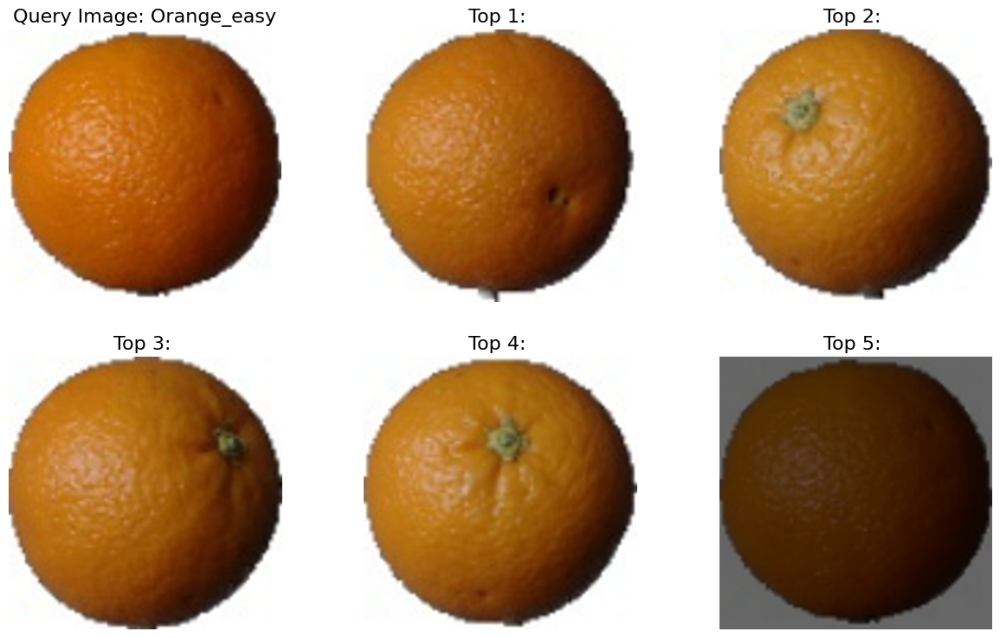

In [17]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query_np, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

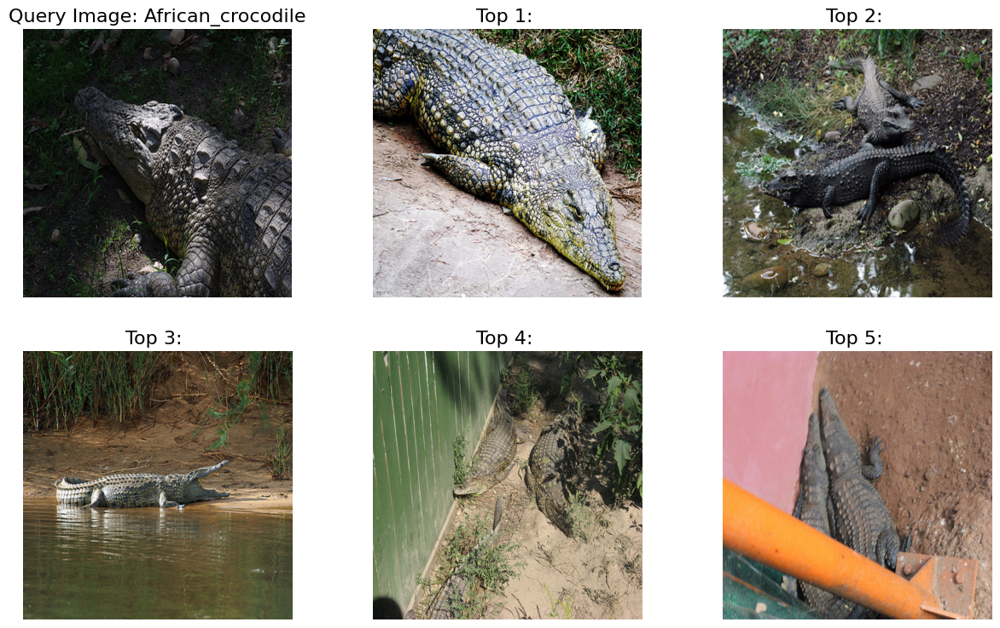

In [18]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [ ]:
sorted(ls_path_score, key=lambda x: x[1])

# 2. Mean square difference

In [19]:
def mean_square_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.sqrt(np.sum((data - query)**2, axis = axis_batch_size))

In [20]:
def get_l2_score(root_image_path,query_path, size):
    query_np = image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(image = query_np)
    for folder in os.listdir(root_image_path):
      if folder in CLASS_NAME:
        data_np, data_paths = folder_to_images(f'{root_image_path}/{folder}', size)
        embedding_list = []
        for idx_img in range(data_np.shape[0]):
            embedding = get_single_image_embedding(image = data_np[idx_img].astype(np.uint8))
            embedding_list.append(embedding)

        rates = mean_square_difference(query_embedding, np.stack(embedding_list))
        ls_path_score = list(zip(data_paths, rates))
    return query_np, ls_path_score

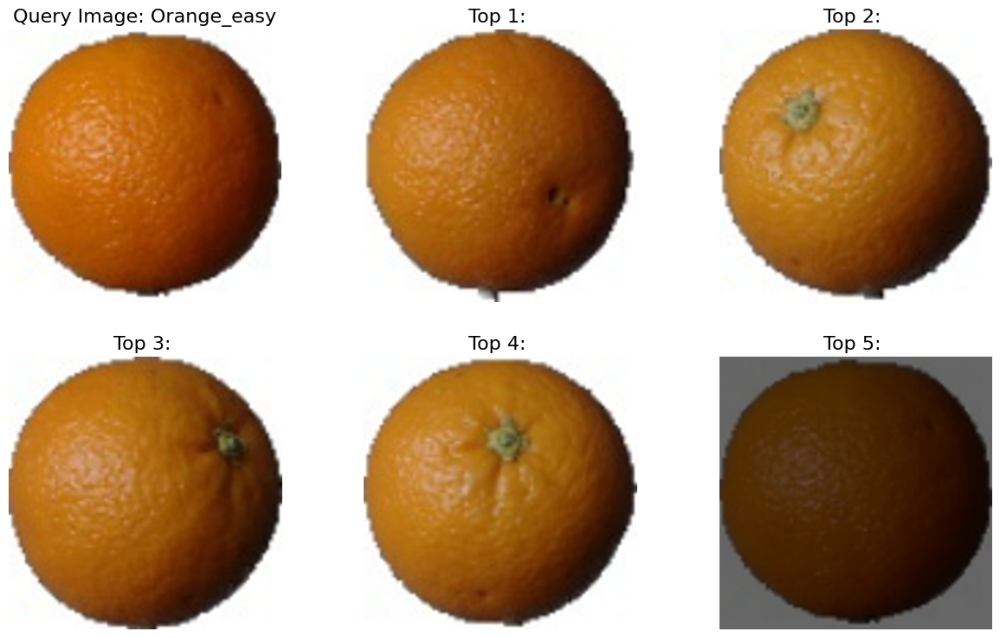

In [21]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

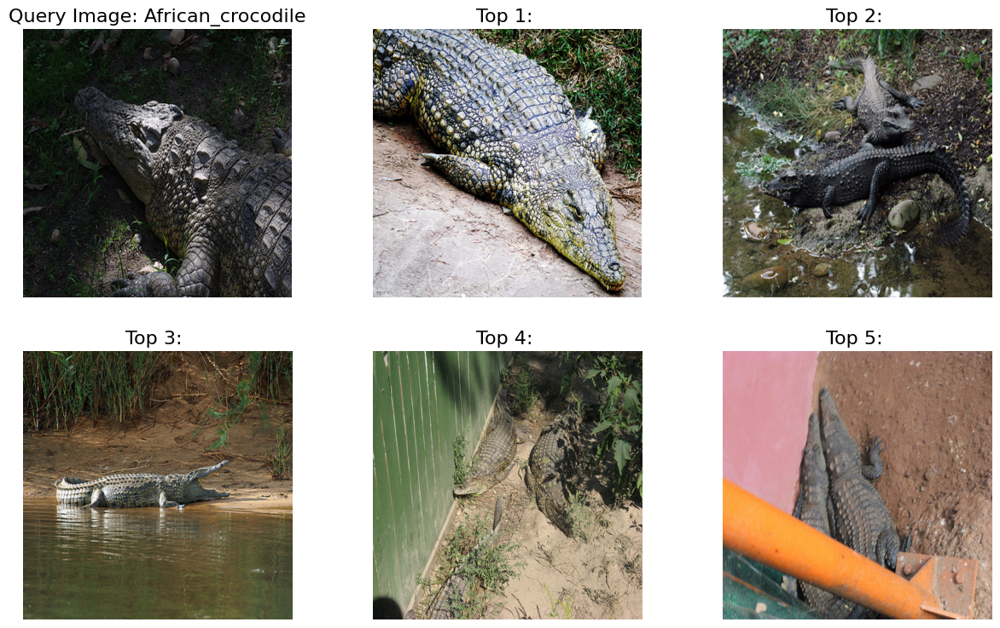

In [23]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [24]:
sorted(ls_path_score, key=lambda x: x[1])

[('data/train//African_crocodile/n01697457_10393.JPEG', 9.512797435381799),
 ('data/train//African_crocodile/n01697457_5586.JPEG', 10.202177606362966),
 ('data/train//African_crocodile/n01697457_14906.JPEG', 11.992313866211248),
 ('data/train//African_crocodile/n01697457_1331.JPEG', 12.823922960917116),
 ('data/train//African_crocodile/n01697457_260.JPEG', 12.857396769337356),
 ('data/train//African_crocodile/n01697457_85.JPEG', 13.500174402113771),
 ('data/train//African_crocodile/n01697457_18587.JPEG', 14.23845772263303),
 ('data/train//African_crocodile/n01697457_8136.JPEG', 14.596690283776297),
 ('data/train//ruffed_grouse/n01797886_17360.JPEG', 14.671811058346066),
 ('data/train//vine_snake/n01739381_5304.JPEG', 15.407671088680218),
 ('data/train//vine_snake/n01739381_5091.JPEG', 15.759102757583605),
 ('data/train//vine_snake/n01739381_5245.JPEG', 15.784383916296065),
 ('data/train//triceratops/n01704323_2435.JPEG', 15.979117934504757),
 ('data/train//triceratops/n01704323_541.JPE

# 3. Cosine similarity

In [25]:
def cosine_similarity(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    query_norm  = np.sqrt(np.sum(query**2))
    data_norm  = np.sqrt(np.sum(data**2, axis = axis_batch_size))
    return np.sum(query*data, axis = axis_batch_size) / ((query_norm * data_norm) + np.finfo(float).eps)

In [26]:
def get_cosine_similarity_score(root_img_path, query_path, size):
    query = image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)
            rates = cosine_similarity(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

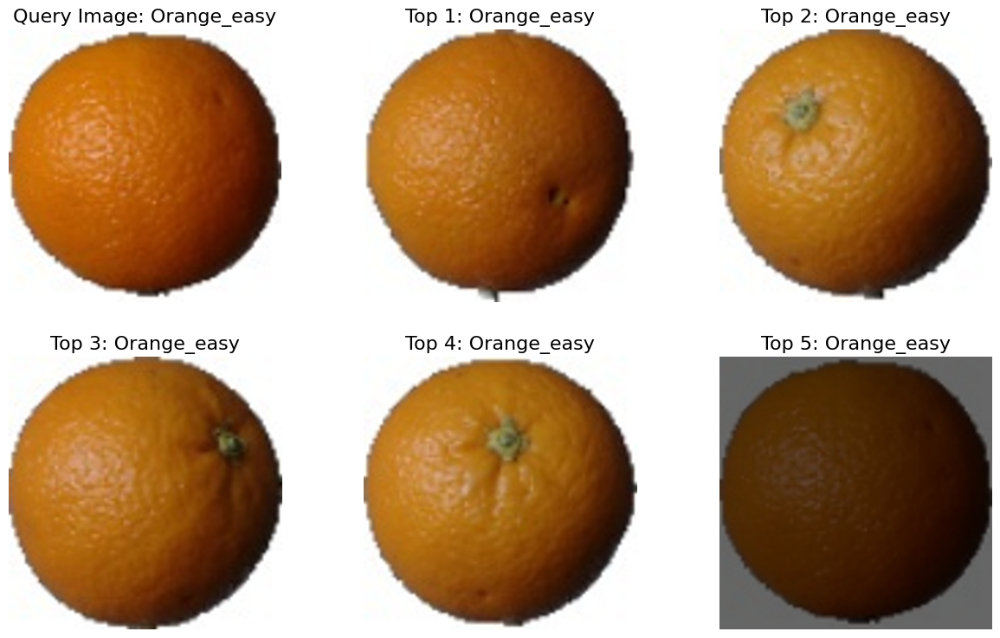

In [27]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

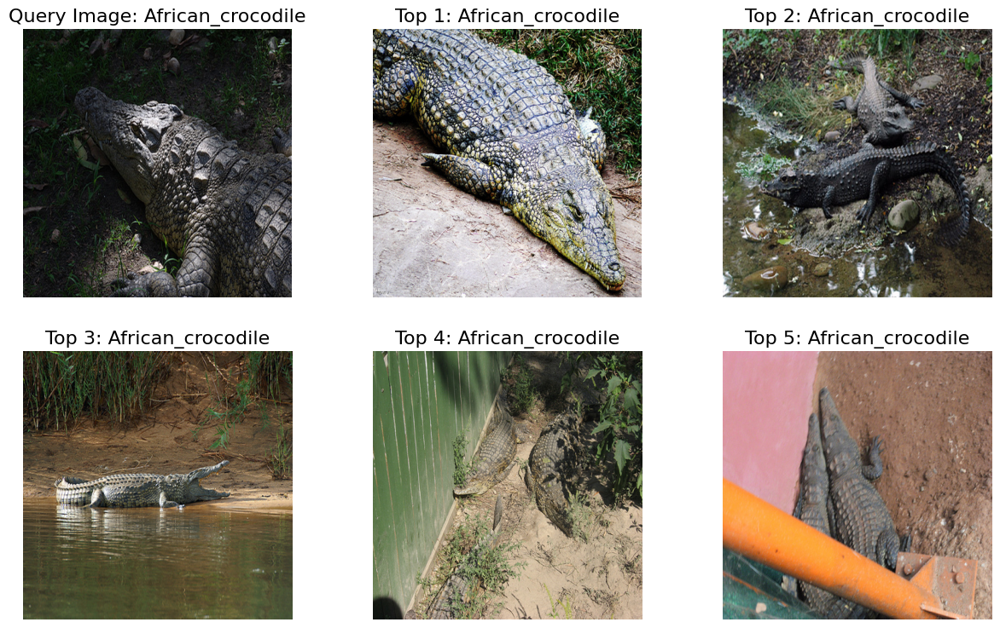

In [28]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [29]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.8573005955187174),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.8350831371484574),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.7762565598072031),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.7426343971245788),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.7264265403370496),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.6959307903652109),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.683019683146589),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.669003214982862),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.6458787872797755),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.6117418682580281),
 ('data/train/lynx/n02127052_3830.JPEG', 0.6019296015813926),
 ('data/train/vine_snake/n01739381_5091.JPEG', 0.6006220316419584),
 ('data/train/triceratops/n01704323_541.JPEG', 0.595647772312137),
 ('data/train/vine_snake/n01739381_5245.JPEG', 0.5950491180251251

# 4. Correlation Coefficient

In [37]:
def correlation_coefficient(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    query_mean = np.mean(query)
    data_mean = np.mean(data, axis=axis_batch_size,keepdims = True)
    query_std = np.sqrt(np.sum((query - query_mean)**2))
    data_std = np.sqrt(np.sum((data - data_mean)**2, axis=axis_batch_size))
    return np.sum((data - data_mean) * (query - query_mean), axis=axis_batch_size) / ((query_std * data_std) + np.finfo(float).eps)

In [33]:
def get_correlation_coefficient_score(root_img_path, query_path, size):
    query = image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(path, size) # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)
            rates = correlation_coefficient(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

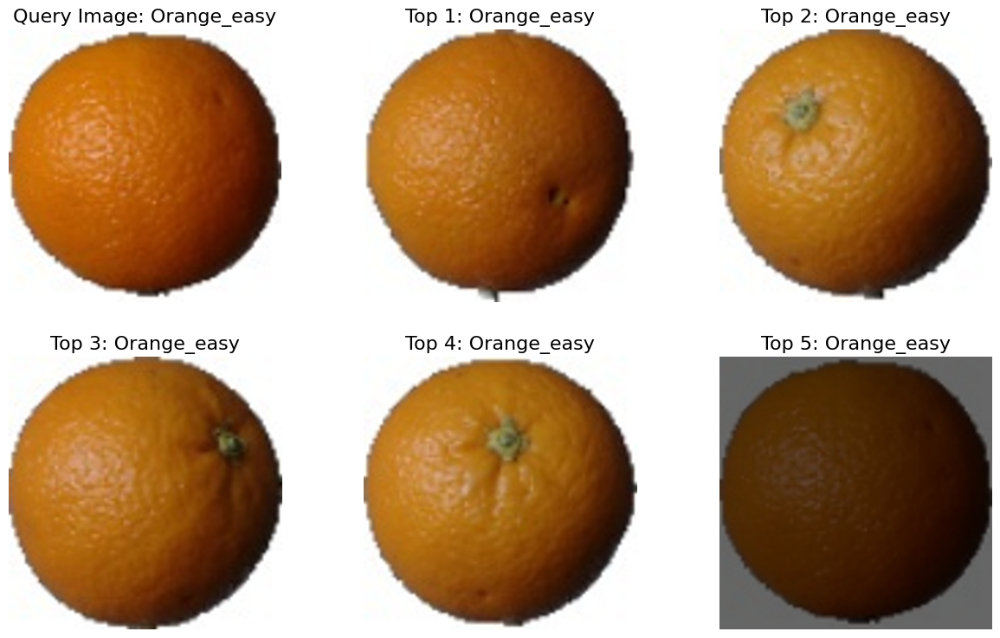

In [38]:
root_img_path = "data/train/"
query_path = "data/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

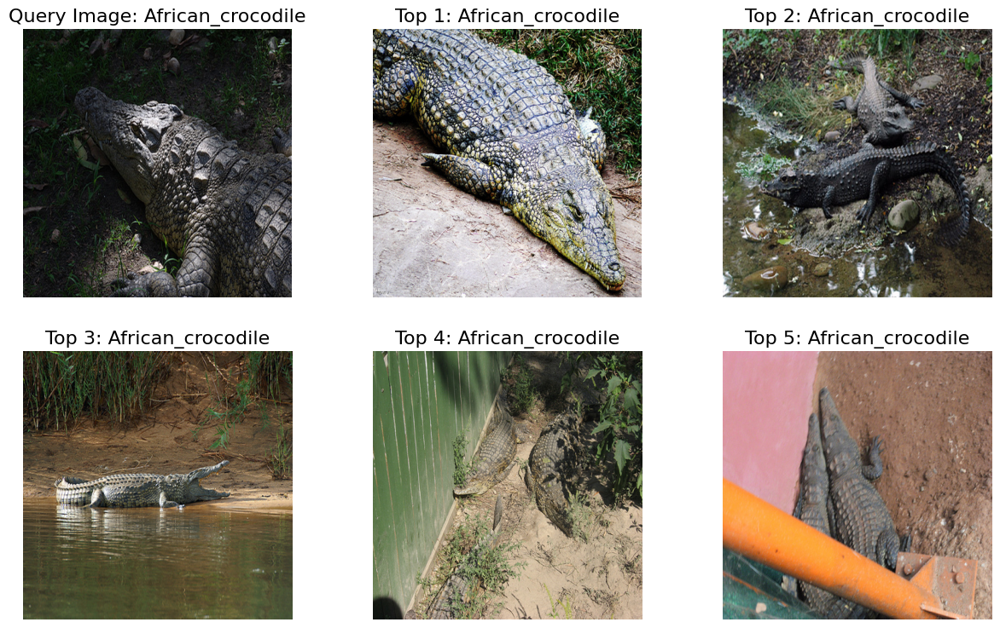

In [39]:
root_img_path = "data/train/"
query_path = "data/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [40]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.8569637558740075),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.8345373107167562),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.775904266318062),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.7422255523058254),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.7255693120796157),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.6951835002913148),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.6819438503330042),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.6695023360216528),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.6457233367080246),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.6115893179416058),
 ('data/train/lynx/n02127052_3830.JPEG', 0.6006350524510013),
 ('data/train/vine_snake/n01739381_5091.JPEG', 0.5997227005603502),
 ('data/train/triceratops/n01704323_541.JPEG', 0.5943107073904121),
 ('data/train/vine_snake/n01739381_5245.JPEG', 0.59346120773912